# Personal Protection Equipment Detection model
This notebook shows how you can use SageMaker Python API to do the following:
 * deploy our model to create an endpoint
 * run Real Time inference on endpoint using local image
 * visualize  and save the prediction on original image

### 1. Start the trial or buy our VitechLab PPE model on AWS Marketplace

You can find our model here: https://aws.amazon.com/marketplace/pp/prodview-b53upp27dnmzq

### 2. Initializing a model using AWS SageMaker Python API

In [1]:
import glob
import os
from os import path
import json

import sagemaker as sage
from sagemaker import get_execution_role

from utils import visualize_detection, get_model_package_arn

In [2]:
sess = sage.Session()
role = get_execution_role()

In [3]:
model_package_arn = get_model_package_arn(sess.boto_region_name)

model = sage.ModelPackage(
    role=role,
    model_package_arn=model_package_arn)

### 3. Generating Prediction using `RealTimePredictor`

#### Creating a new endpoint

In [4]:
endpoint_name='ppe-bbb-model-example-endpoint'

model.deploy(initial_instance_count=1, instance_type='ml.m4.2xlarge', endpoint_name=endpoint_name)

-------------------------------------------------------------------------------------------------!

In [5]:
predictor = sage.predictor.RealTimePredictor(
    endpoint_name,
    sagemaker_session=sess, 
    content_type="image/jpeg"
)

## Generating predictions for Laboratory Personal Protective Equipment checking

In [6]:
sample_data_path = 'sample_data/'
folder_name = 'lab'

image_files = sorted(glob.glob(sample_data_path + f'input_{folder_name}/*.jpg'))

out_folder = sample_data_path + f'output_{folder_name}/'
os.makedirs(out_folder, exist_ok=True)

predict_args = {
        'CustomAttributes': json.dumps({
            # 'no_helmet', 'no_glasses', 'no_glove'
            # 'lab_coat', 'lab_no_glasses', 'lab_no_glove', 'lab_no_mask'
            'detection-elements': ['lab_coat', 'lab_no_glasses', 'lab_no_glove', 'lab_no_mask'],
        })
}

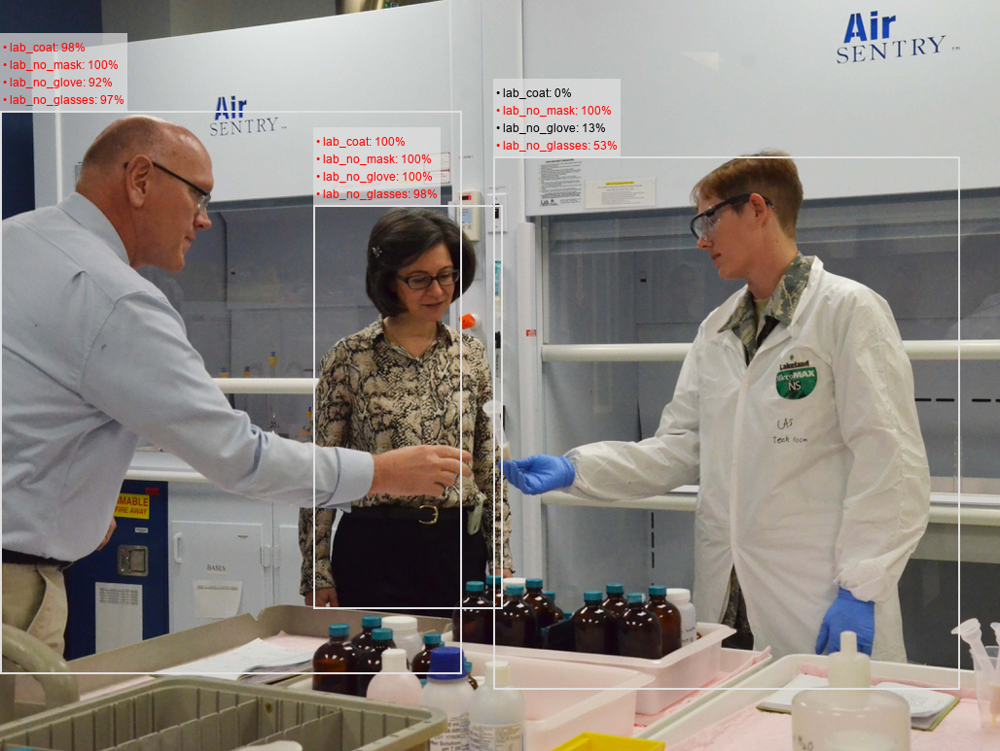

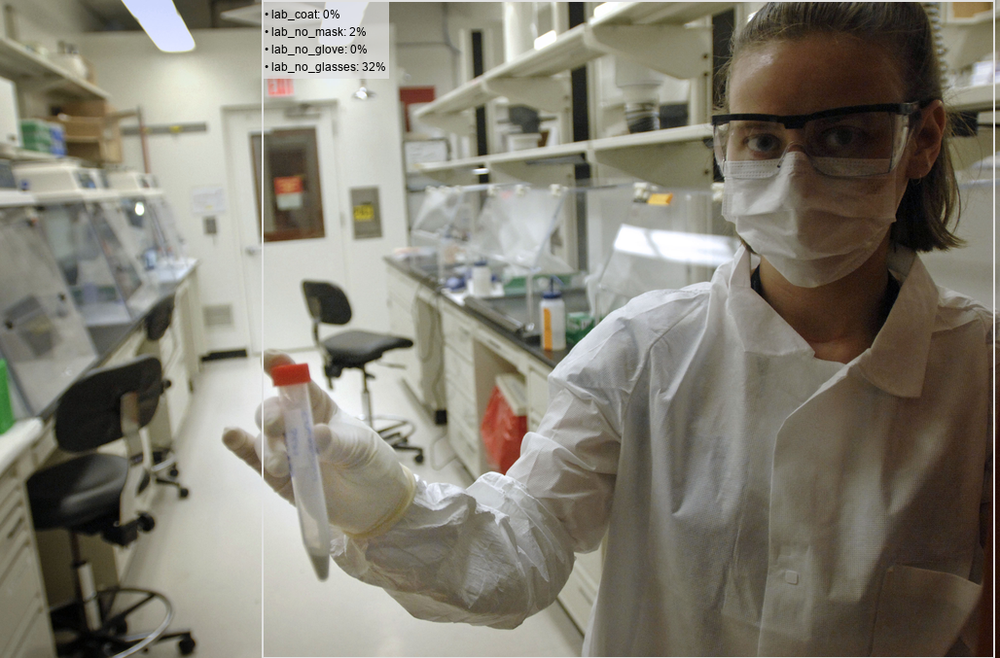

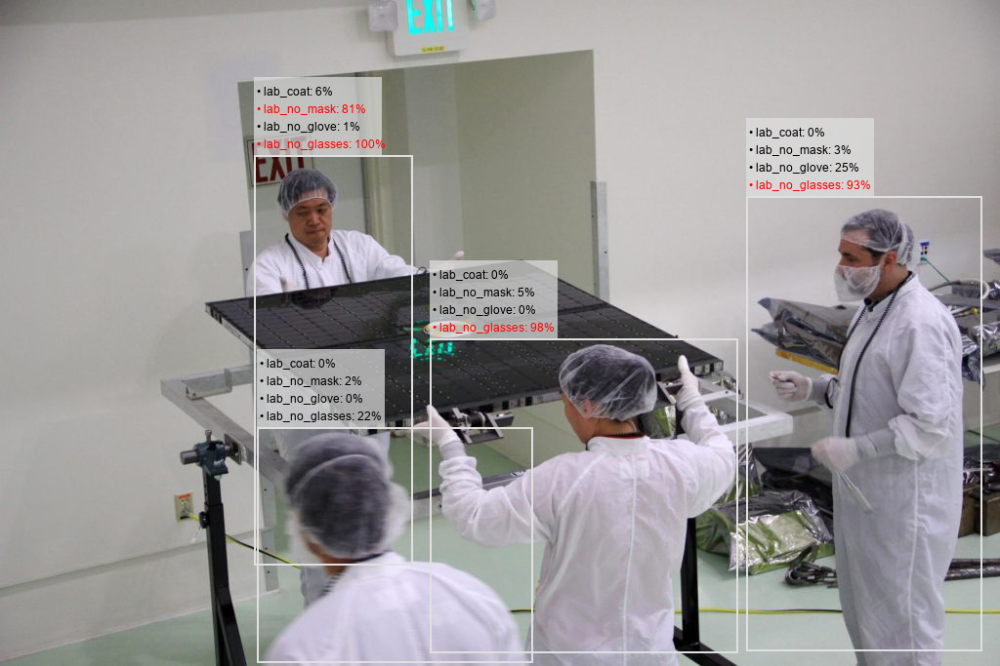

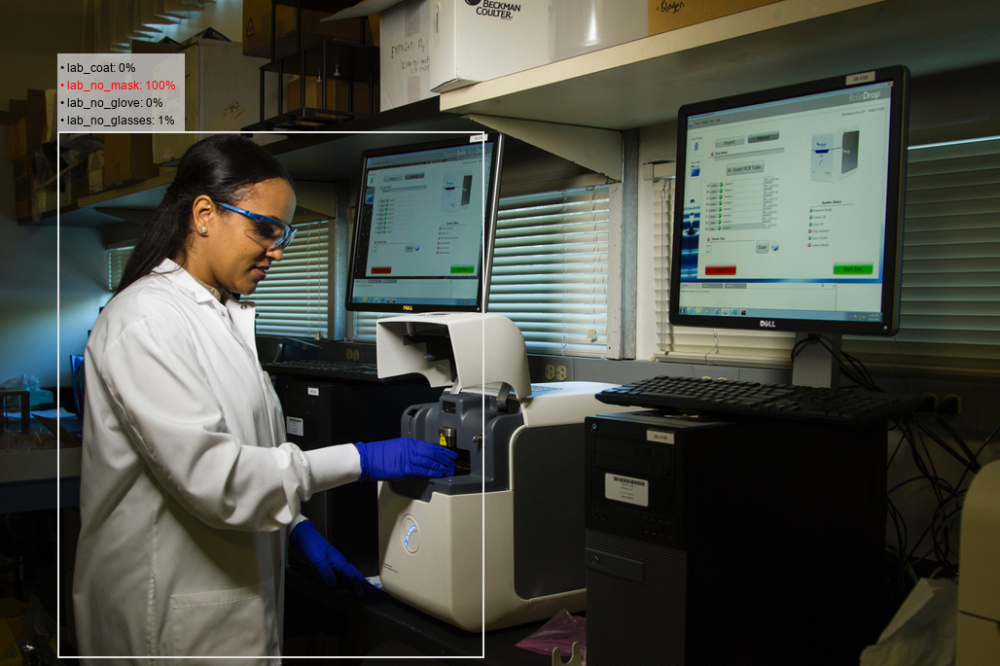

In [60]:
for i, image_path in enumerate(image_files):
    # read new image as byte array
    with open(image_path, 'rb') as image:
        f = image.read()
        image_bytes = bytearray(f)
    
    # run inference on current image
    last_result = predictor.predict(image_bytes, predict_args).decode("utf-8")
    
    last_result = json.loads(last_result)
    
    dest_path = out_folder + path.basename(image_path)
    visualize_detection(image_path, last_result, dest_path)

In [61]:
last_result

[{'name': 'person',
  'percentage_probability': 99.94882345199585,
  'box_points': [301, 683, 2511, 3409],
  'classes': {'lab_no_glasses': 0.8309968747198582,
   'lab_no_glove': 0.018597469897940755,
   'lab_no_mask': 99.98270869255066,
   'lab_coat': 0.002882829176087398}}]

## Personal Protective Equipment checking for Manufacturing\Construction

In [7]:
sample_data_path = 'sample_data/'
folder_name = 'manuf'

image_files = sorted(glob.glob(sample_data_path + f'input_{folder_name}/*.jpg'))

out_folder = sample_data_path + f'output_{folder_name}/'
os.makedirs(out_folder, exist_ok=True)

predict_args = {
        'CustomAttributes': json.dumps({
            'detection-elements': ['no_helmet', 'no_glasses', 'no_glove'],
        })
}

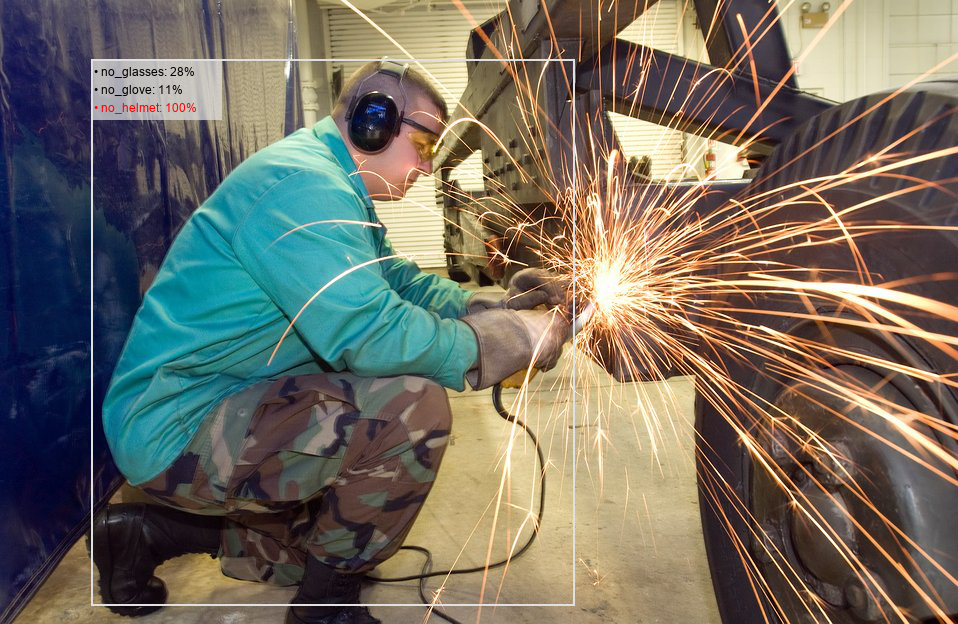

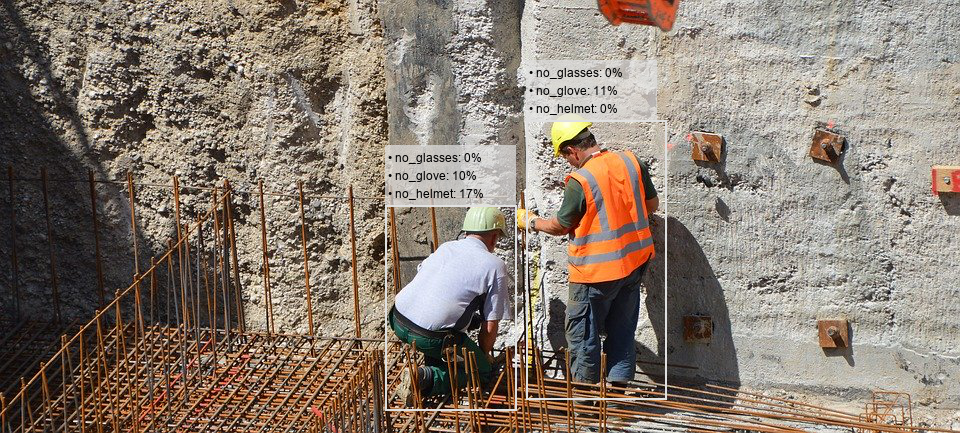

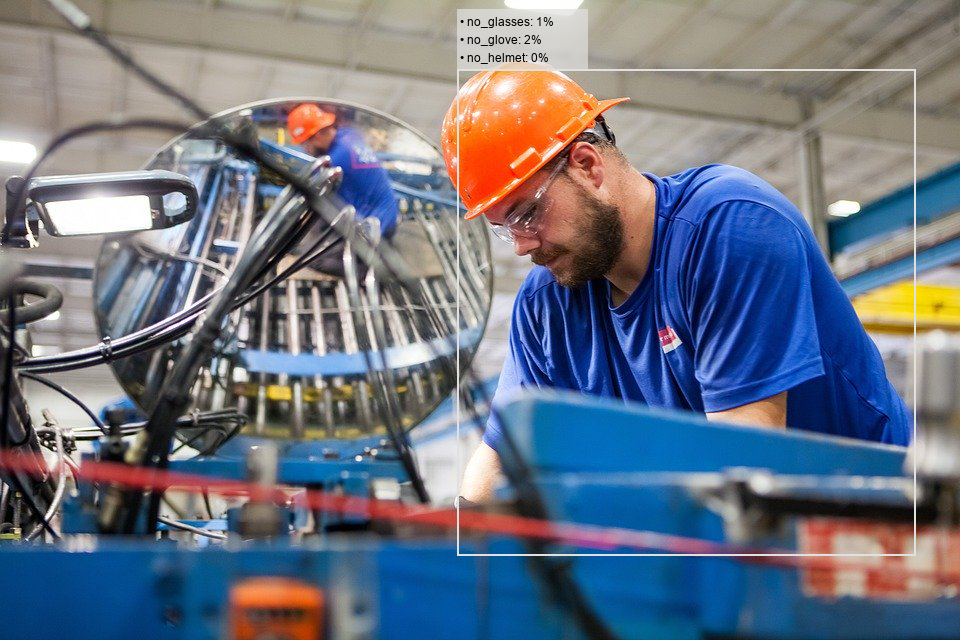

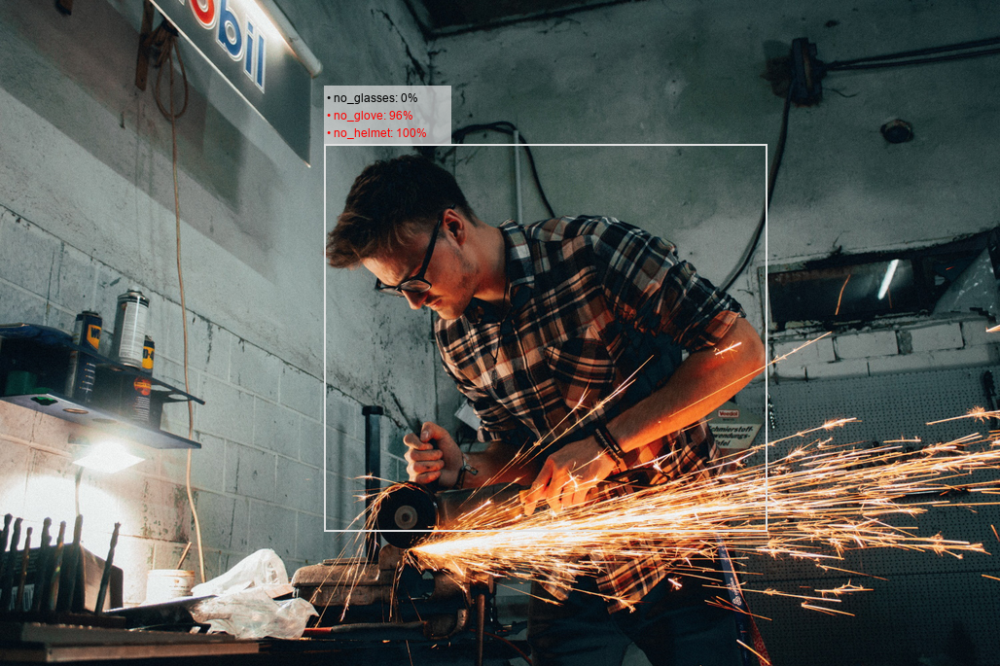

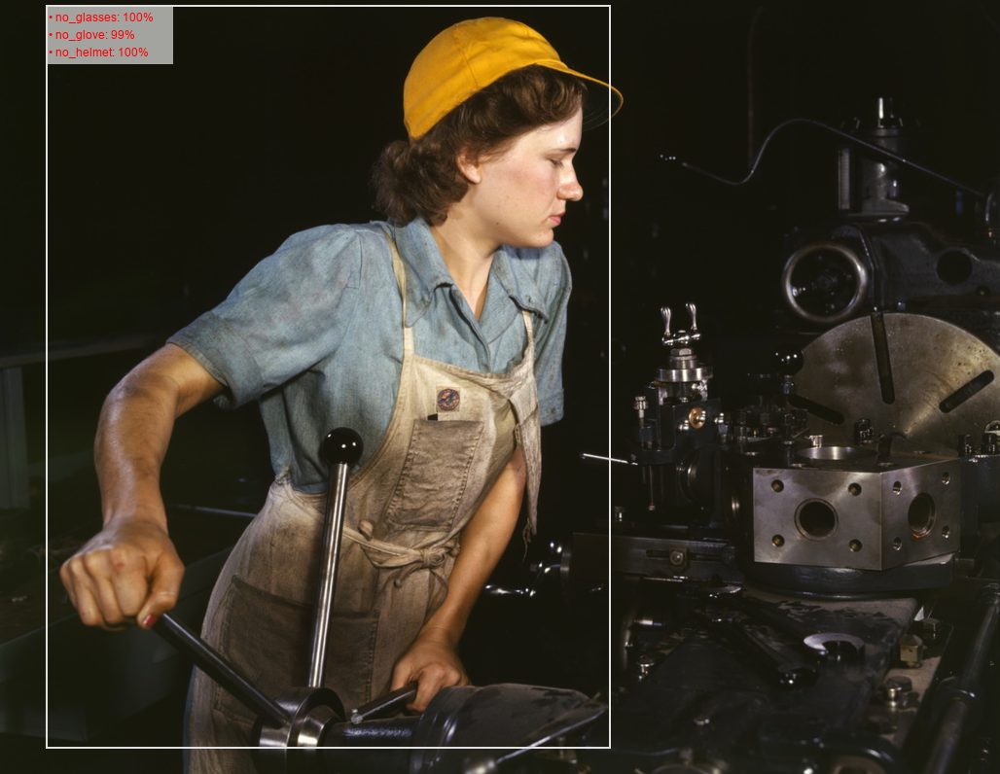

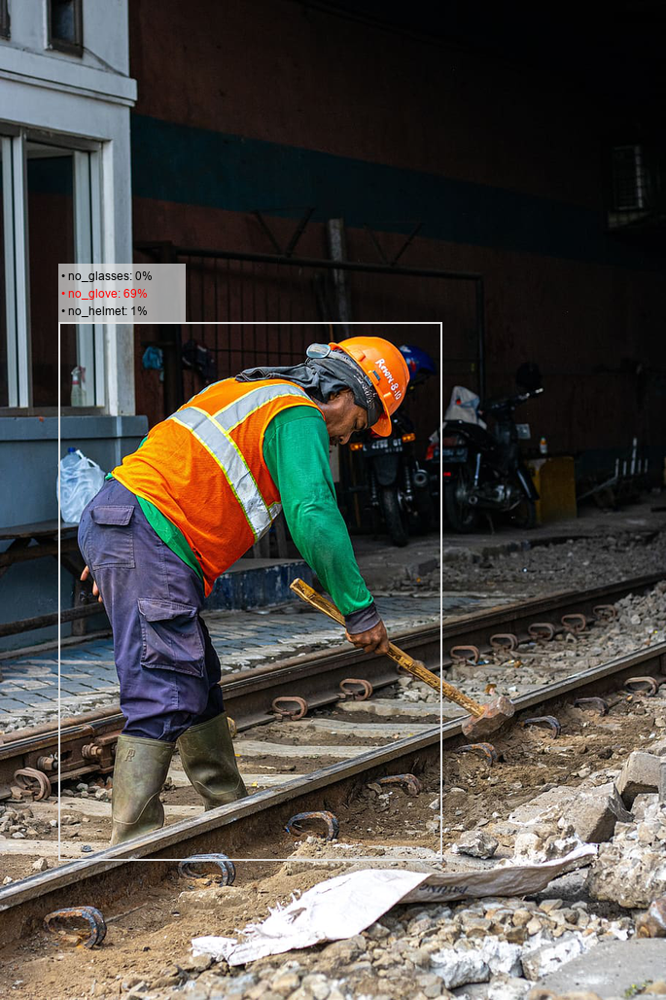

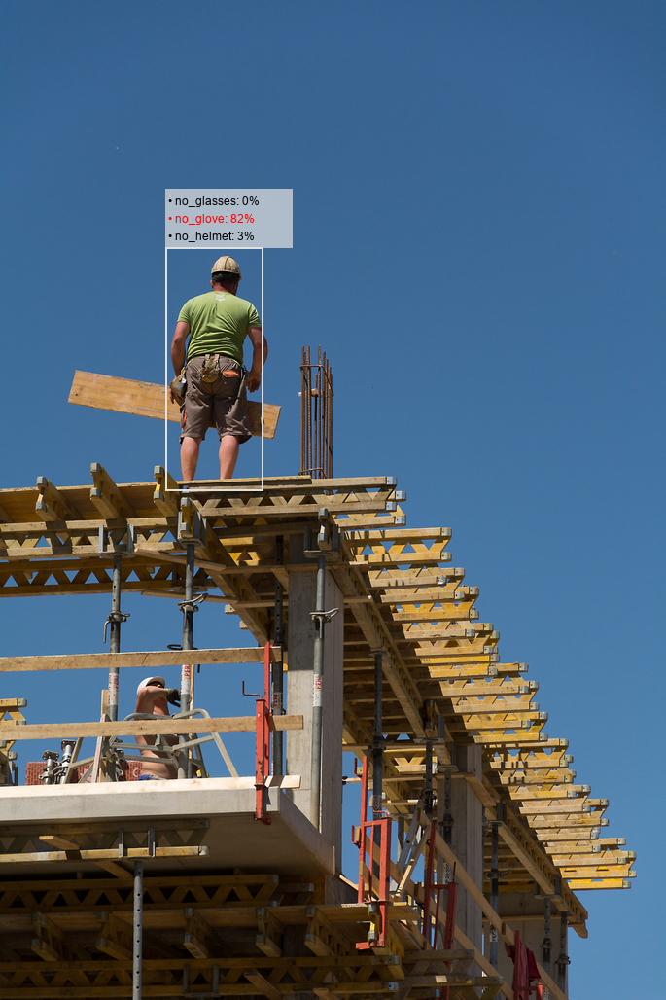

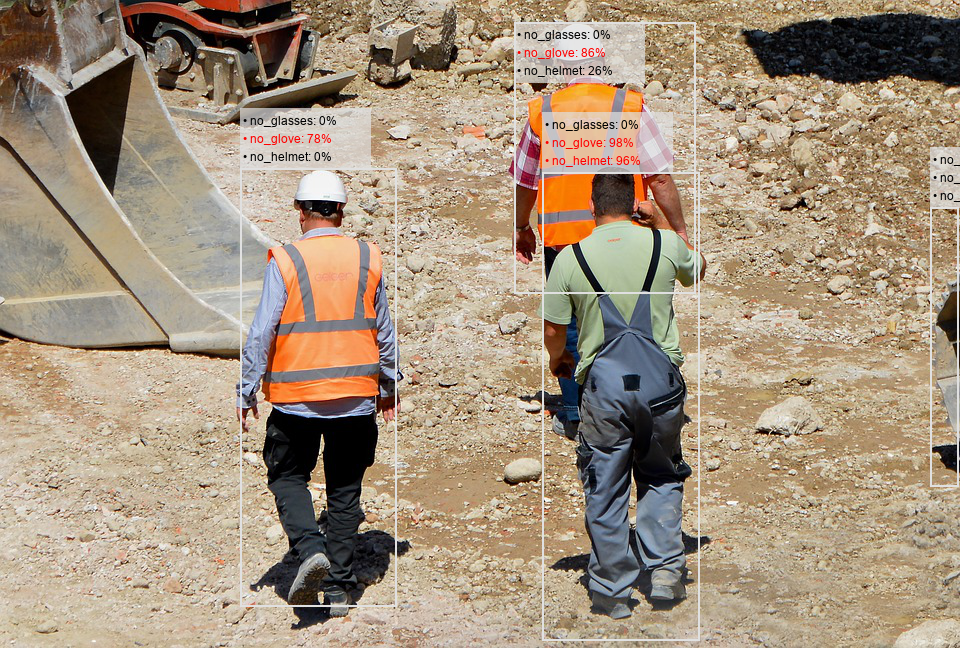

In [8]:
for i, image_path in enumerate(image_files):
    # read new image as byte array
    with open(image_path, 'rb') as image:
        f = image.read()
        image_bytes = bytearray(f)
    
    # run inference on current image
    last_result = predictor.predict(image_bytes, predict_args).decode("utf-8")
    
    last_result = json.loads(last_result)
    
    dest_path = out_folder + path.basename(image_path)
    visualize_detection(image_path, last_result, dest_path)

In [9]:
last_result

[{'name': 'person',
  'percentage_probability': 54.71334457397461,
  'box_points': [930, 207, 958, 486],
  'glasses_faces': [{'bbox': [122.0, 101.0, 140.0, 144.0],
    'face_confidence': 0.43544888496398926,
    'face_probability': 0.01613602787256241,
    'no_glasses_probability': 0}],
  'classes': {'no_helmet': 27.633848786354065,
   'no_glove': 1.1285428889095783,
   'no_glasses': 0}},
 {'name': 'person',
  'percentage_probability': 97.16218709945679,
  'box_points': [514, 22, 695, 293],
  'glasses_faces': [],
  'classes': {'no_helmet': 26.110365986824036,
   'no_glove': 86.17390990257263,
   'no_glasses': 0}},
 {'name': 'person',
  'percentage_probability': 99.4135856628418,
  'box_points': [542, 172, 699, 640],
  'glasses_faces': [],
  'classes': {'no_helmet': 95.83554863929749,
   'no_glove': 97.50561714172363,
   'no_glasses': 0}},
 {'name': 'person',
  'percentage_probability': 99.85045790672302,
  'box_points': [240, 168, 396, 606],
  'glasses_faces': [],
  'classes': {'no_hel

### Delete the Endpoint
Having an endpoint running will incur some costs. Therefore as a clean-up job, we should delete the endpoint.

In [10]:
sess.delete_endpoint(predictor.endpoint)